## ... Continuation of 0_Completeworkflow_crypt.ipynb

In [35]:
import scanpy as sc
import scvi
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np


np.random.seed(42)

In [36]:
adata = sc.read_h5ad('/home/glennrdx/Documents/Research_Project/processed_h5ad/crypt_enriched_temp.h5ad')

In [37]:
adata

AnnData object with n_obs × n_vars = 27419 × 17573
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden', '_scvi_batch', '_scvi_labels', 'published_annotations'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'Diet_colors', 'Sample_colors', 'neighbors', 'published_annotations_colors', 'umap'
    obsm: 'X_pca', 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs'
    obsp: 'connectivities', 'distances'

## Reclustering the EEC Group

Enteroendocrine (EE) cell types are usually classified based on their hormone production:

1. **L cells**  
   - Hormones: Glucagon-like peptide 1  
   - Markers: *Gcg*

2. **I cells**  
   - Hormones: Cholecystokinin  
   - Markers: *Cck*

3. **Enterochromaffin (EC) cells**  
   - Hormones: Serotonin  
   - Markers: *Tph1*, *Tac1*

4. **X cells**  
   - Hormones: Ghrelin  
   - Markers: *Ghrl*

5. **S cells**  
   - Hormones: Secretin  
   - Markers: *Sec*

6. **K cells**  
   - Hormones: Gastric inhibitory peptide  
   - Markers: *Gip*

7. **Delta cells**  
   - Hormones: Somatostatin  
   - Markers: *Sst*

8. **N cells**  
   - Hormones: Neurotensin  
   - Markers: *Nts*


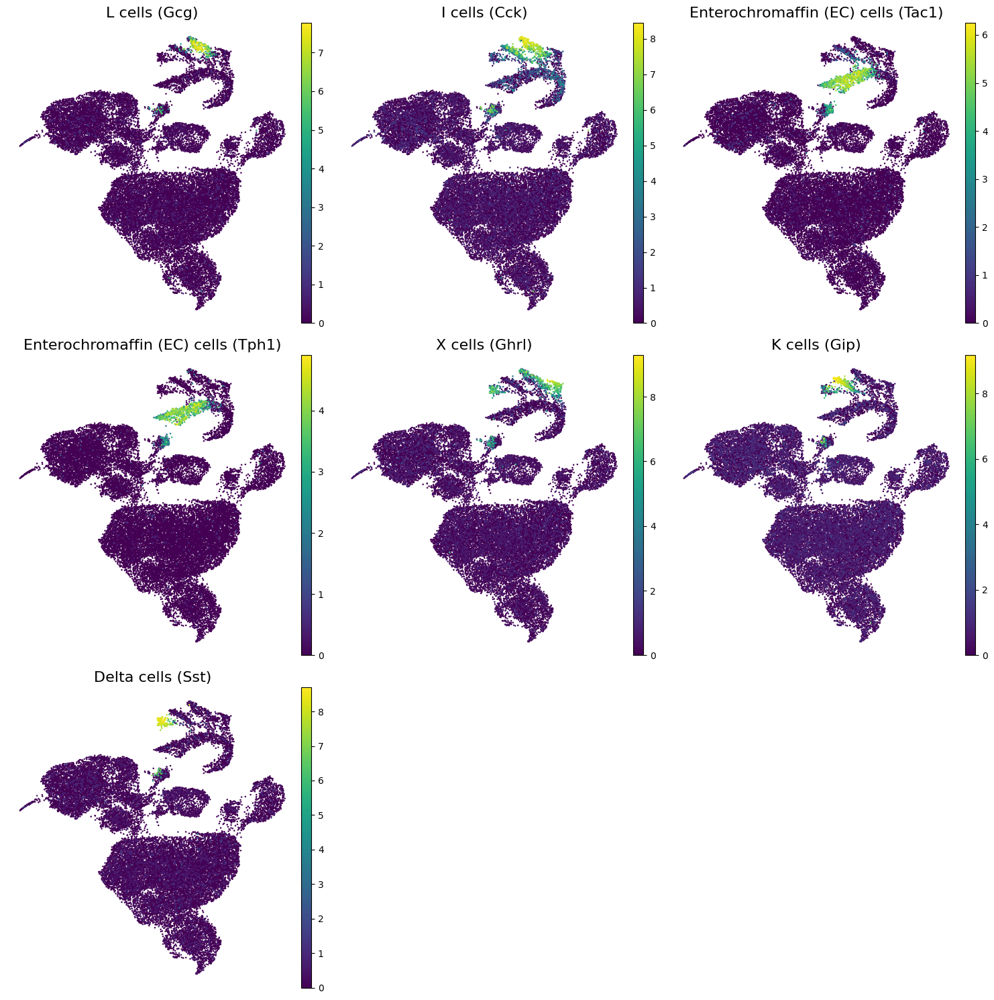

In [38]:
# Plot UMAP marker gene heatmap
marker_genes = ['Gcg', 'Cck', 'Tac1', 'Tph1', 'Ghrl', 'Gip', 'Sst']

marker_titles = {
    'Gcg': 'L cells (Gcg)',
    'Cck': 'I cells (Cck)',
    'Tac1': 'Enterochromaffin (EC) cells (Tac1)',
    'Tph1': 'Enterochromaffin (EC) cells (Tph1)',
    'Ghrl': 'X cells (Ghrl)',
    'Gip': 'K cells (Gip)',
    'Sst': 'Delta cells (Sst)'
}

# Create subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))  

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Plot each marker gene on a separate axis
for i, gene in enumerate(marker_genes):
    sc.pl.umap(
        adata,
        color=gene,
        frameon=False,
        size=13,
        ax=axes[i],
        color_map='viridis',
        show=False
    )
    axes[i].set_title(marker_titles[gene], fontsize=16)

# Remove empty subplots
for j in range(len(marker_genes), len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

In [39]:
# Recluster the EEC cluster and add to a newly created annotation column in adata.obs 'EEC_refined_1'
sc.tl.louvain(adata, restrict_to=('published_annotations',['EEC']), key_added='EEC_refined_1', resolution=0.5, random_state = 1)

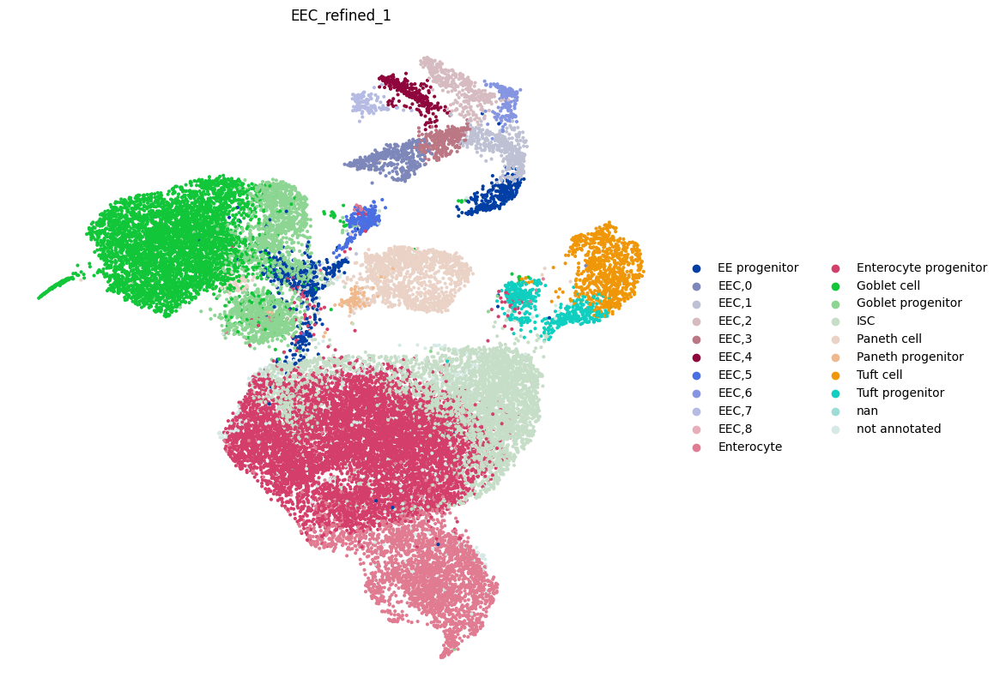

In [40]:
# Plot the UMAP
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["EEC_refined_1"],
    frameon=False,
    size=35,
    ax=ax
)

# Show the plot
plt.show()

In [41]:
# Annotate the newly clustered EEC clusters based off the marker gene heatmap

map1 = {'EEC (I/L)': ['EEC,2'],
        'EEC (EC)': ['EEC,0', 'EEC,3'],
        'EEC (X)': ['EEC,6'],
        'EEC (K)': ['EEC,4'],
        'EEC (Delta)': ['EEC,7']}

class_map = {v: k for k,vv in map1.items() for v in vv}

adata.obs['EEC_refined_final'] = adata.obs['EEC_refined_1']

adata.obs['EEC_refined_final'] = adata.obs['EEC_refined_1'].map(lambda x: class_map.get(x, 'EEC NS' if 'EEC' in x else x))

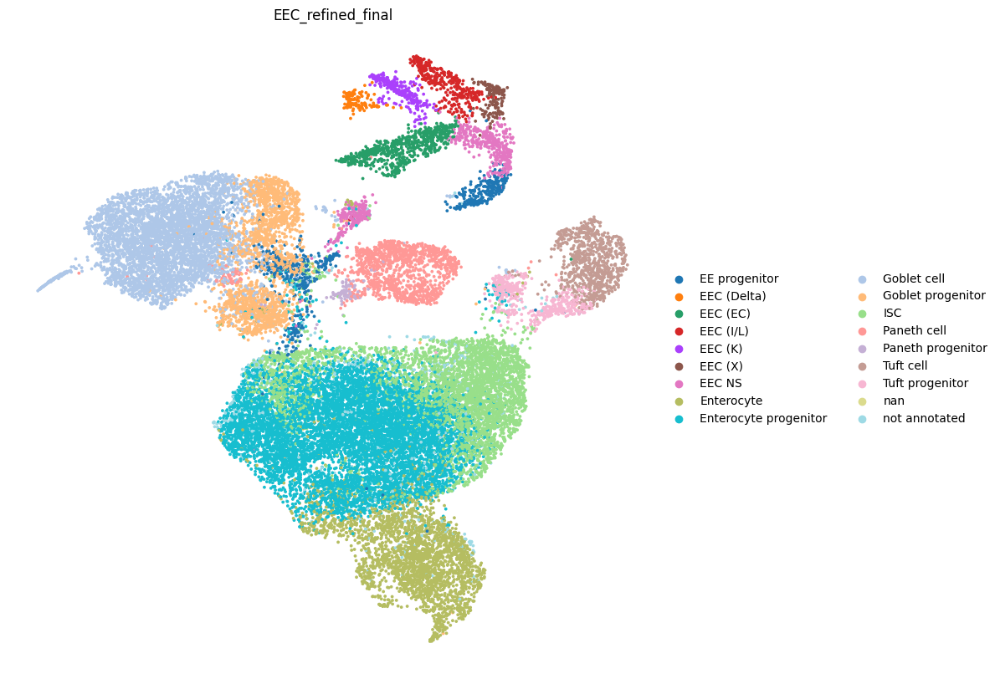

In [42]:
# Replot the UMAP
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["EEC_refined_final"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()


## Remove non specific cells from EE progenitor

In [43]:
# Recluster the EEC progenitor cluster
sc.tl.louvain(adata, restrict_to=('EEC_refined_final',['EE progenitor']), key_added='final_annotations', resolution=0.2, random_state = 1)

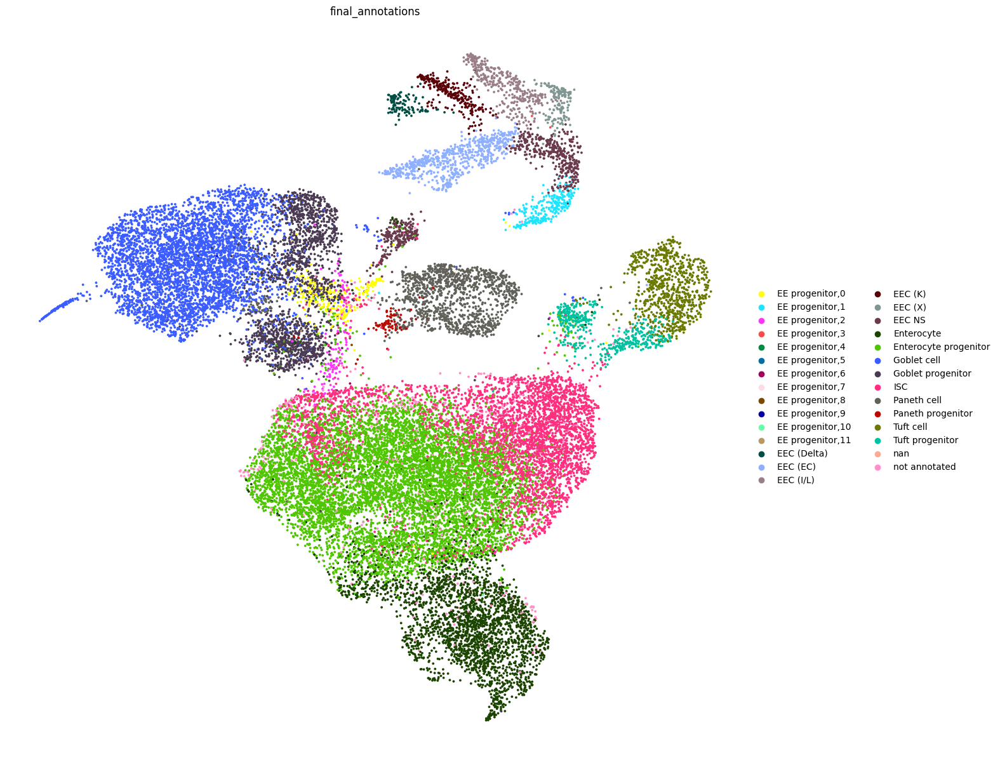

In [44]:
# Plot the UMAP again to view the new clusters
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

In [45]:
# Count number of cells in EEC groups
# Assuming 'adata' is your AnnData object and 'final_annotations' is the cluster column
cluster_labels = adata.obs['final_annotations']

# Create a DataFrame for easier manipulation
df = pd.DataFrame({'cluster': cluster_labels})

# Filter clusters where the name contains 'EE'
filtered_clusters = df[df['cluster'].str.contains('EE')]

# Count the number of cells in each cluster
cluster_counts = filtered_clusters['cluster'].value_counts()

# Print the counts
print(cluster_counts)


EEC (EC)                 684
EEC NS                   629
EEC (I/L)                352
EEC (K)                  264
EE progenitor,0          263
EE progenitor,1          254
EEC (X)                  150
EEC (Delta)              118
EE progenitor,2          112
EE progenitor,3            2
EE progenitor,6            1
EE progenitor,4            1
EE progenitor,5            1
EE progenitor,11           1
EE progenitor,10           1
EE progenitor,9            1
EE progenitor,8            1
EE progenitor,7            1
Enterocyte                 0
Enterocyte progenitor      0
Goblet cell                0
Goblet progenitor          0
ISC                        0
Paneth cell                0
Paneth progenitor          0
Tuft cell                  0
Tuft progenitor            0
nan                        0
not annotated              0
Name: cluster, dtype: int64


In [46]:
# Combine small EEC clusters into one cluster:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,3',
    'EE progenitor,6',
    'EE progenitor,4',
    'EE progenitor,5',
    'EE progenitor,11',
    'EE progenitor,10',
    'EE progenitor,9',
    'EE progenitor,8',
    'EE progenitor,7'
]
target_label = 'EE progenitor,3'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

# Optionally, check the distribution of clusters after the update
print(adata.obs['final_annotations'].value_counts())

Enterocyte progenitor    8325
Goblet cell              4539
ISC                      3943
Enterocyte               2598
Goblet progenitor        1844
Paneth cell              1258
Tuft cell                 816
not annotated             699
EEC (EC)                  684
EEC NS                    629
Tuft progenitor           476
EEC (I/L)                 352
EEC (K)                   264
EE progenitor,0           263
EE progenitor,1           254
EEC (X)                   150
EEC (Delta)               118
EE progenitor,2           112
Paneth progenitor          82
EE progenitor,3            10
nan                         3
Name: final_annotations, dtype: int64


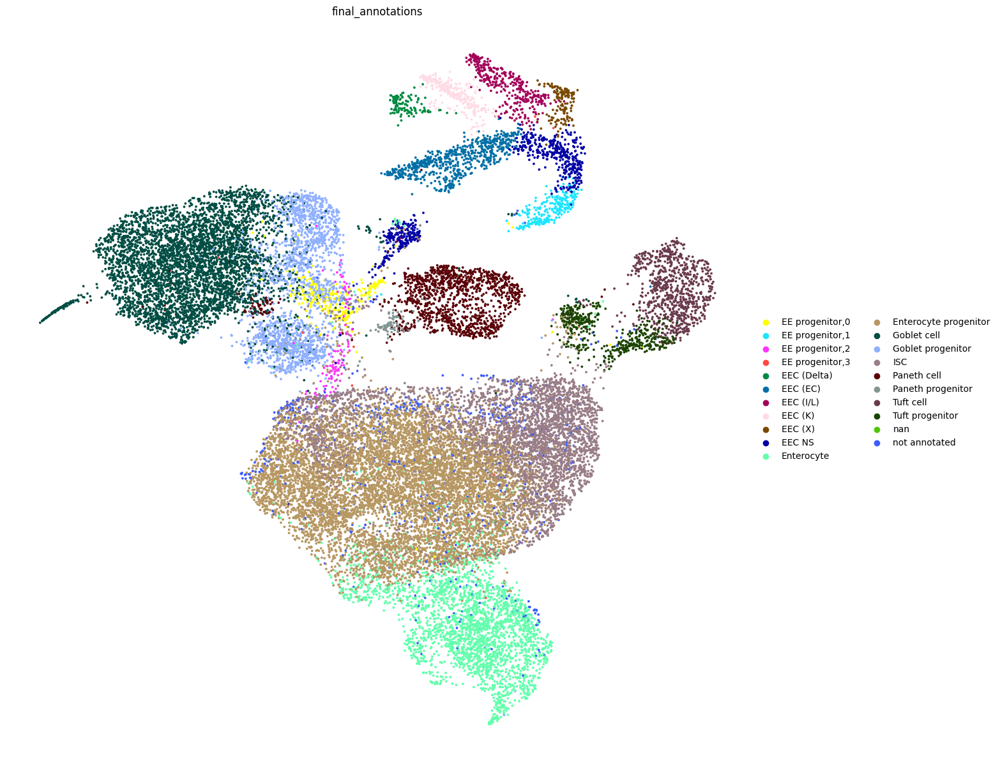

In [47]:
# Plot the UMAP again to view the new clusters
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

In [48]:
# Add EEC progenitor 3 to the 'not annotated' cluster

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,3'
]
target_label = 'not annotated'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [49]:
# Combine EEC progenitors into one cluster:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EE progenitor,0',
    'EE progenitor,2'
]
target_label = 'Unkown progenitor'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [50]:
# Combine nan and not annotated clusters:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'nan',
    'not annotated'
]
target_label = 'not annotated'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['final_annotations'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

In [51]:
# Rename 'EE progenitor,1' to 'EE progenitor'
adata.obs['final_annotations'] = adata.obs['final_annotations'].replace('EE progenitor,1', 'EE progenitor')

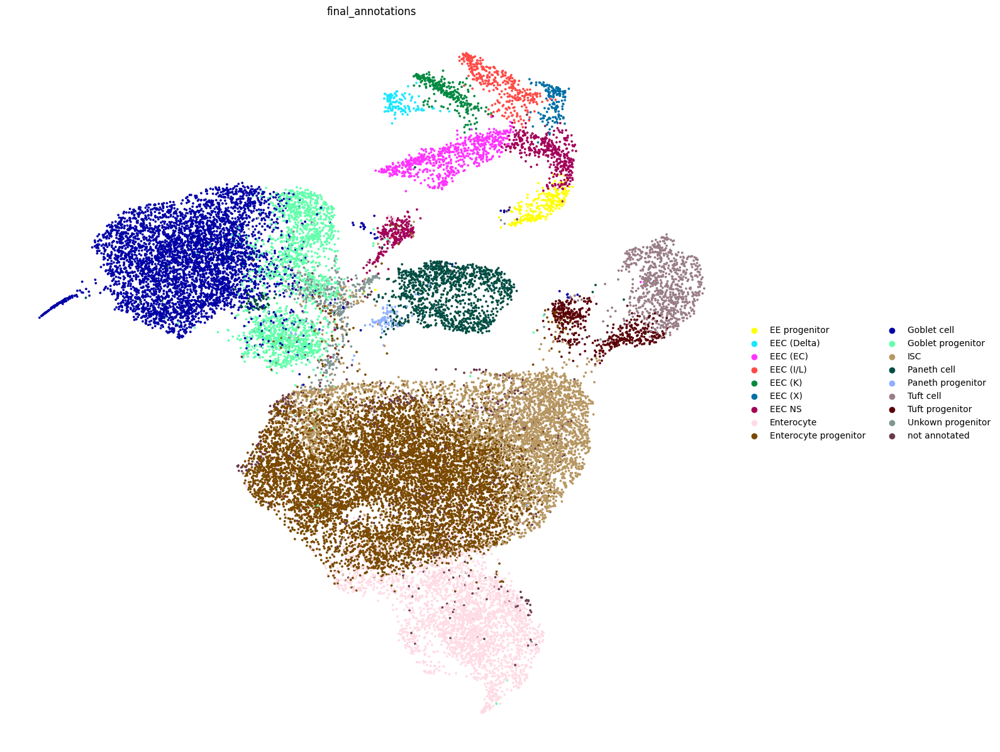

In [52]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(15, 15))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["final_annotations"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

## Confirming annotations with marker genes (violin plots/heatmap)

In [53]:
marker_dict = {'ISC': ['Lgr5', 'Olfm4', 'Axin2', 'Ascl2', 'Slc12a2'],
               'Enterocyte': ['Fabp1', 'Alpi', 'Apoa1', 'Apoa4', 'Lct'],
               'Goblet': ['Muc2', 'Tff3', 'Agr2', 'Spdef', 'Klf4', 'Tff3', 'Ccl9', 'Manf'],
               'Goblet progenitor': ['Spdef', 'Atoh1'],
               'Paneth': ['Lyz1', 'Mmp7', 'Defa17', 'Defa22', 'Ang4'],
               'EEC': ['Neurod1', 'Neurod2', 'Insm1', 'Chga', 'Chgb'],
               'EE progenitor': ['Sox4', 'Neurog3', 'Foxa2', 'Foxa3', 'Marcksl1'],
               'Tuft': ['Dclk1', 'Trpm5', 'Gfi1b', 'Il25'],
               'Lymphocyte': ['Coro1a', 'Cd52', 'Cd37']
               }

#### - Create violin plots: expression of markers per cluster

Violin plot: Clusters expressing ISC markers:


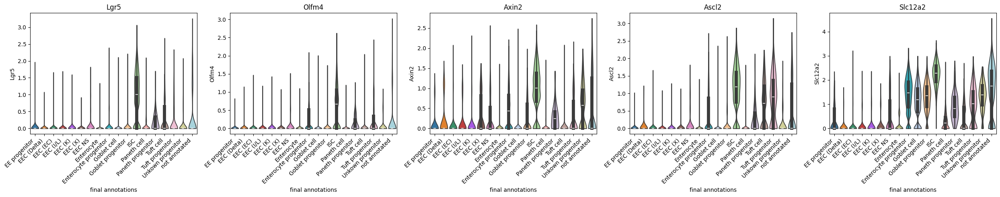

Violin plot: Clusters expressing Enterocyte markers:


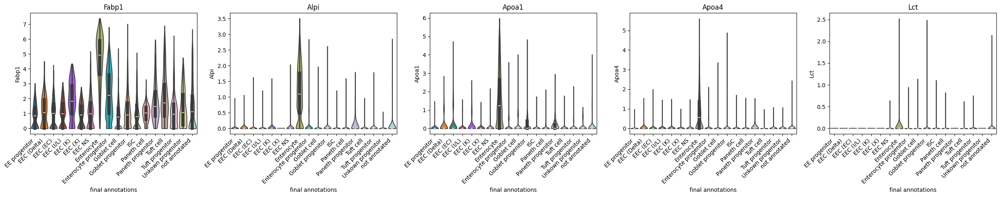

Violin plot: Clusters expressing Goblet markers:


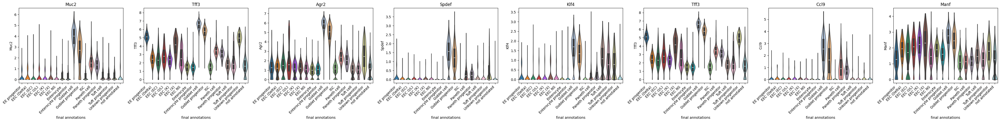

Violin plot: Clusters expressing Goblet progenitor markers:


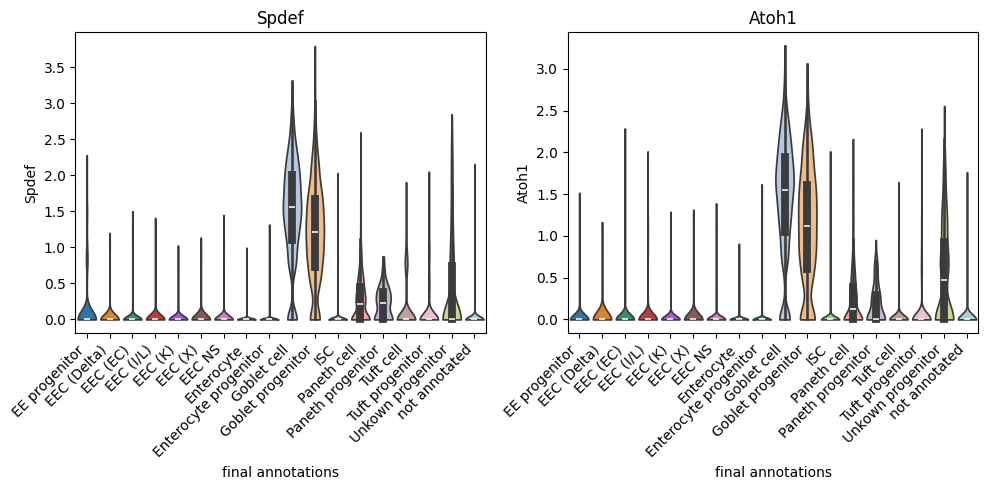

Violin plot: Clusters expressing Paneth markers:


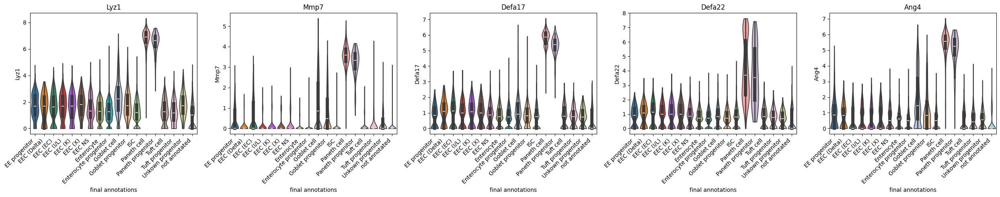

Violin plot: Clusters expressing EEC markers:


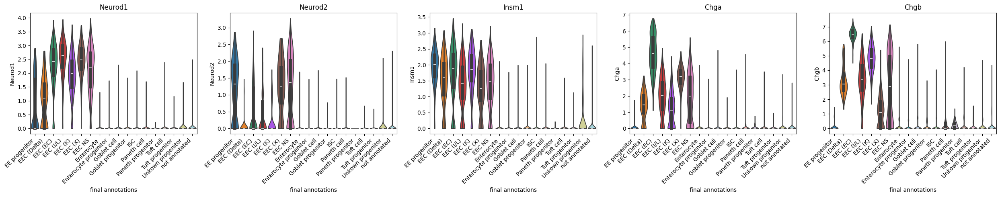

Violin plot: Clusters expressing EE progenitor markers:


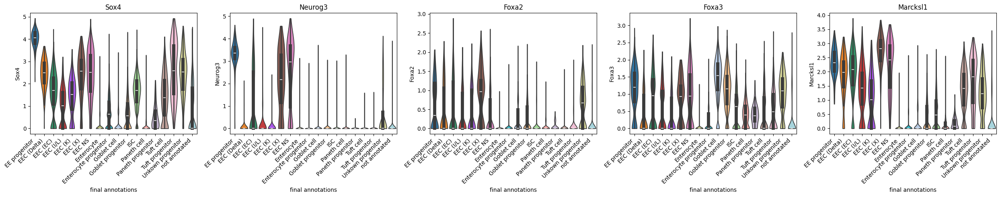

Violin plot: Clusters expressing Tuft markers:


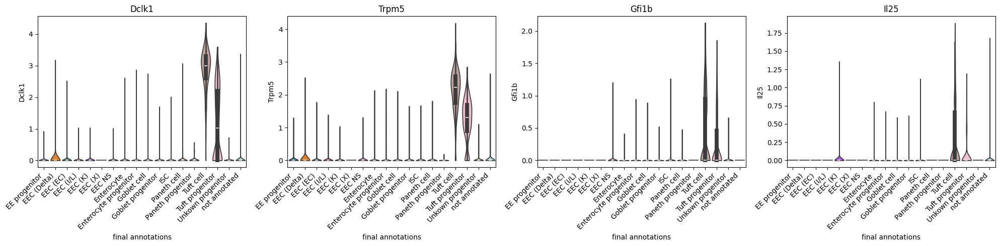

Violin plot: Clusters expressing Lymphocyte markers:


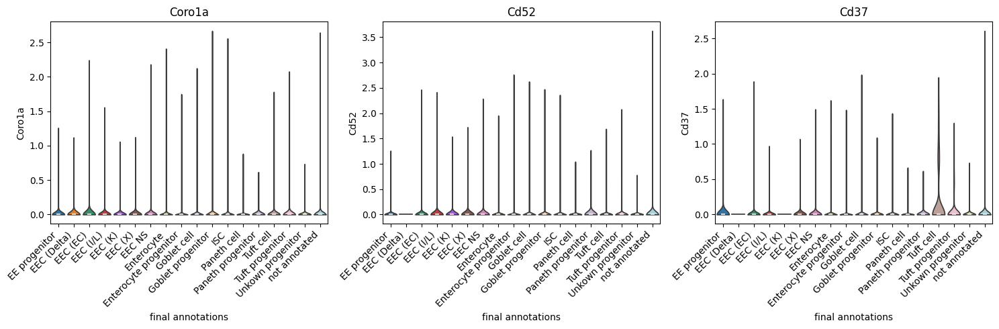

In [54]:
# Iterate over items in marker_dict
for marker, genes in marker_dict.items():
    print(f"Violin plot: Clusters expressing {marker} markers:")
    
    # Create a figure with subplots for this marker
    fig, axes = plt.subplots(1, len(genes), figsize=(len(genes) * 5, 5))
    
    # Iterate over genes associated with the current marker
    for i, gene in enumerate(genes):
        # Select the current axis
        ax = axes[i]
        
        # Plot the violin plot
        sc.pl.violin(adata,
                     keys=gene,
                     groupby='final_annotations',
                     inner="box",
                     stripplot=False,
                     show=False,
                     ax=ax)  # Pass the axis to plot on
        
        # Set plot title (optional)
        ax.set_title(gene)
        
        # Adjust alignment of x-axis labels
        for tick in ax.get_xticklabels():
            tick.set_rotation(45)
            tick.set_horizontalalignment('right')
    
    # Adjust layout to prevent overlap
    plt.tight_layout()
    
    # Display the plots for the current marker
    plt.show()

#### - Colour the umap by marker genes

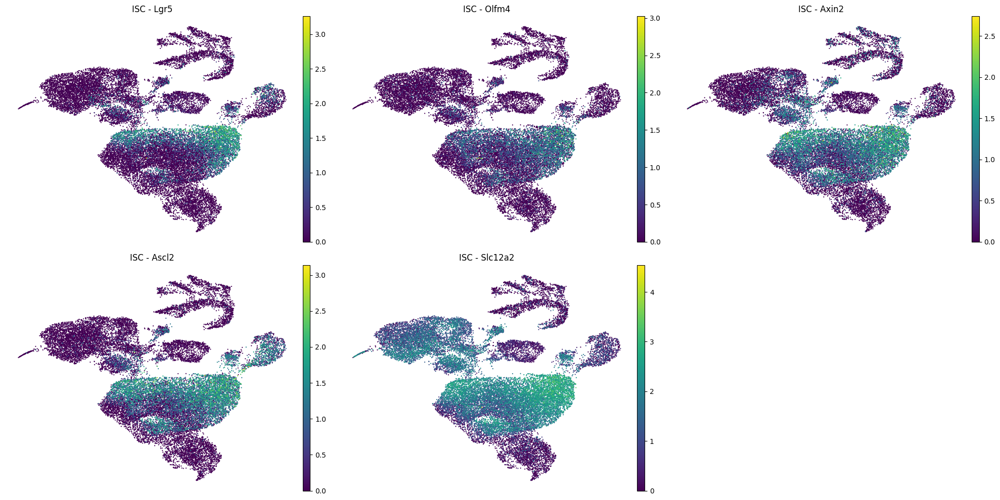

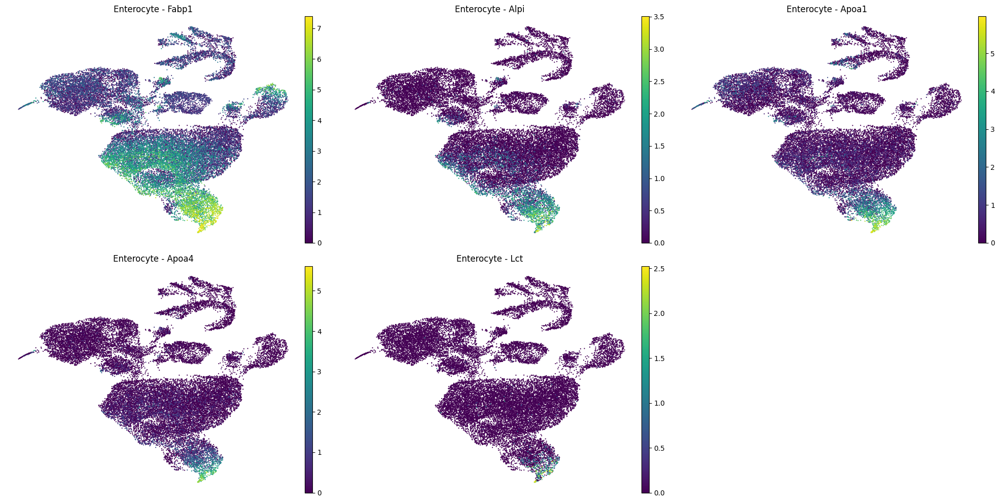

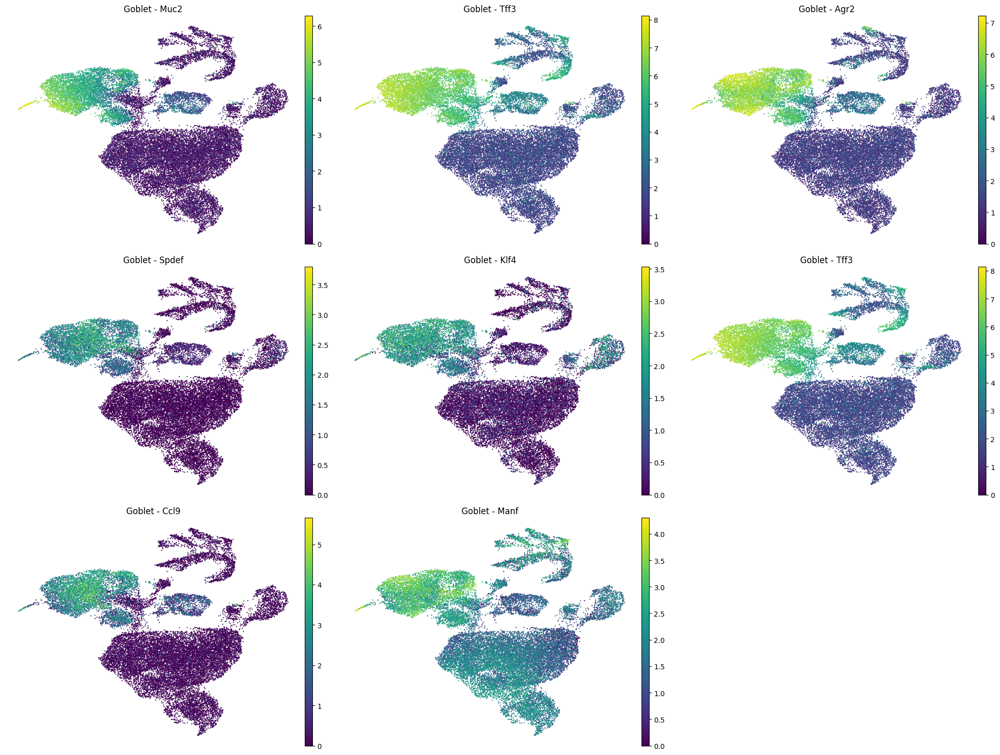

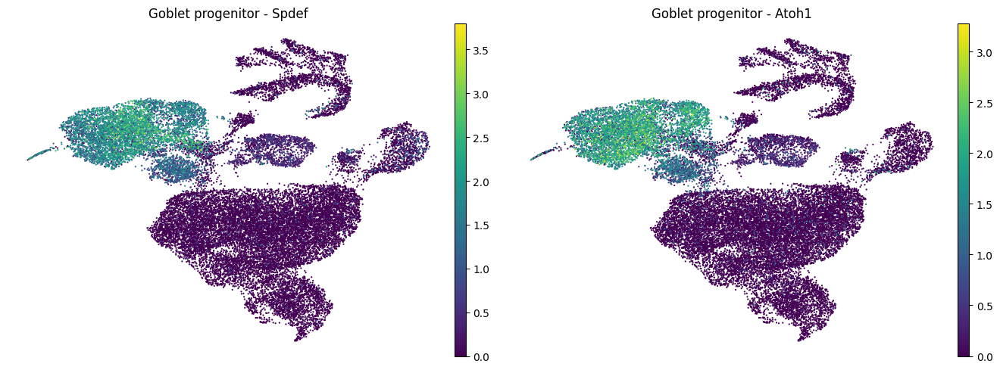

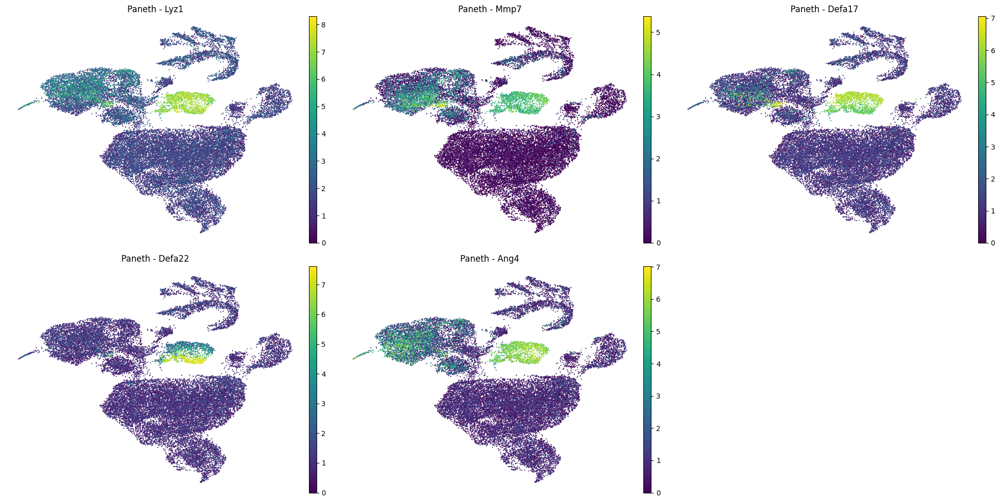

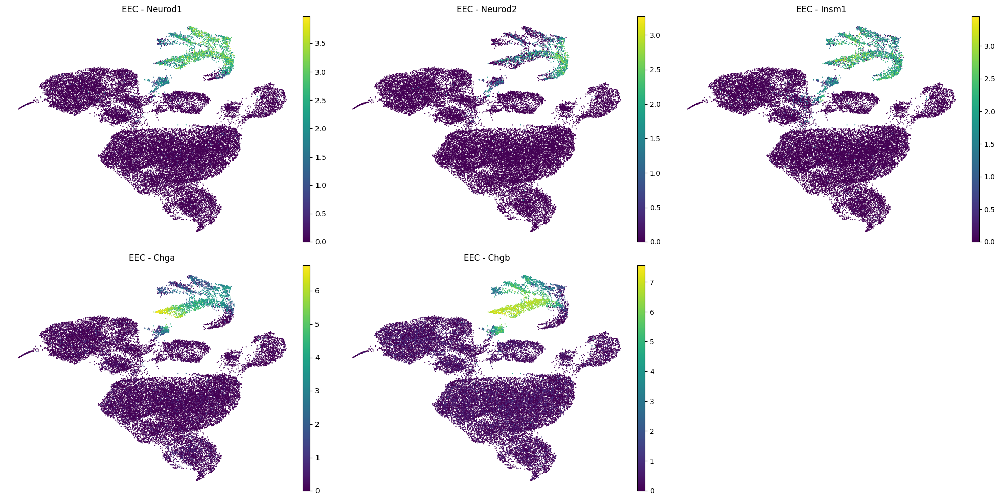

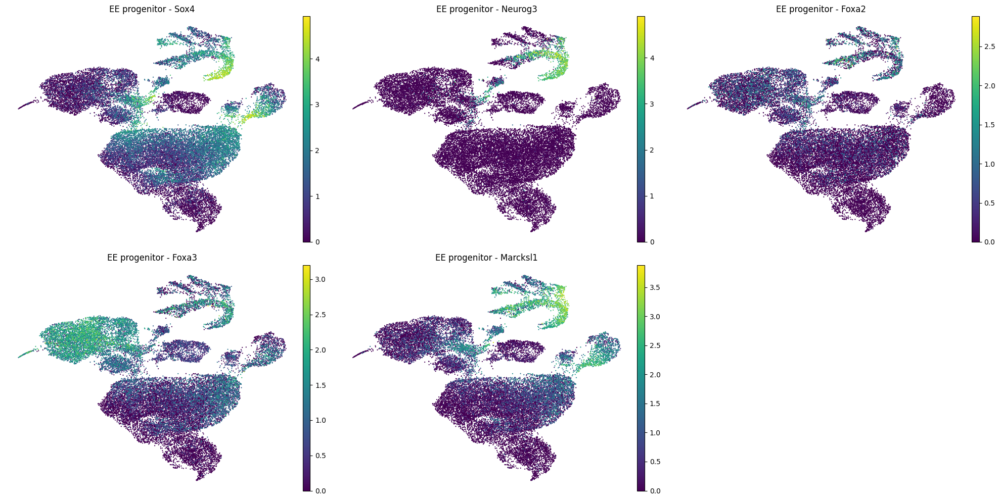

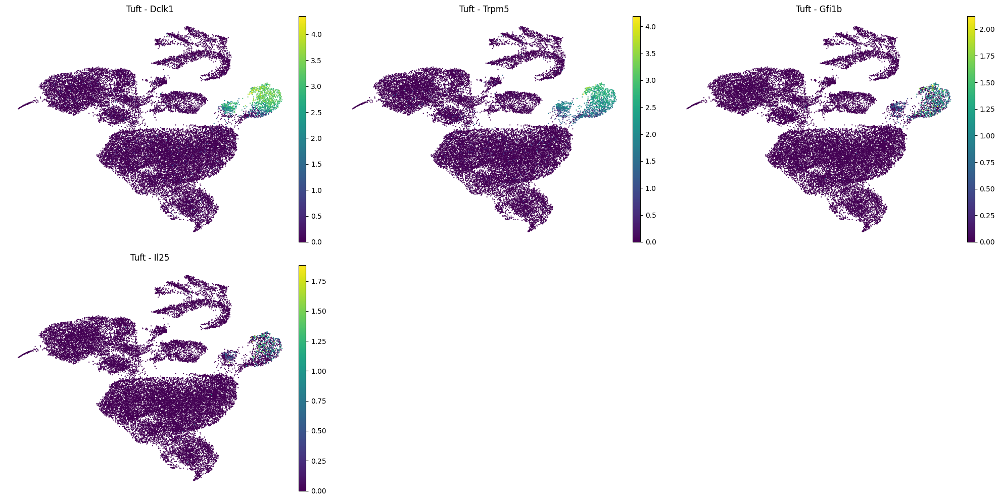

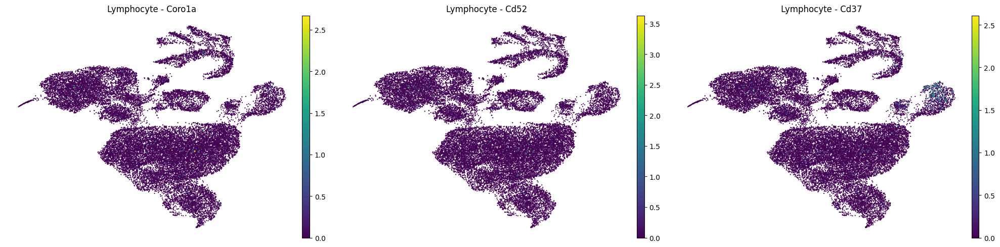

In [55]:
# Loop through each cell type and their markers
for cell_type, markers in marker_dict.items():
    # Calculate the number of rows needed
    n_markers = len(markers)
    n_cols = 3
    n_rows = (n_markers + n_cols - 1) // n_cols  # Ceiling division

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))

    # Flatten the axes array for easier indexing
    axes = axes.flatten()

    for i, gene in enumerate(markers):
        sc.pl.umap(
            adata, 
            color=gene, 
            title=f'{cell_type} - {gene}',
            frameon=False, 
            ax=axes[i], 
            size = 10,
            color_map='viridis', 
            show=False
        )
        axes[i].set_facecolor('black')

    # Remove empty subplots
    for j in range(n_markers, len(axes)):
        fig.delaxes(axes[j])

    # Adjust layout
    plt.tight_layout()
    plt.show()

## Create an annotation of all major cell types (not clustered into different EEC groups)

In [56]:
cells_crypts = adata.obs['final_annotations'].unique()
print('List of unique cells in crypt data:')
for cell in cells_crypts:
    print(cell)

List of unique cells in crypt data:
Enterocyte progenitor
Goblet cell
EEC (EC)
EEC (I/L)
Goblet progenitor
ISC
not annotated
Tuft progenitor
Enterocyte
Tuft cell
EE progenitor
EEC NS
Unkown progenitor
Paneth cell
EEC (K)
EEC (X)
EEC (Delta)
Paneth progenitor


In [57]:
# Combine nan and not annotated clusters:

# Define the clusters to combine and the target label
clusters_to_combine = [
    'EEC (EC)',
    'EEC (I/L)',
    'EEC (K)',
    'EEC (X)',
    'EEC (Delta)',
    'EEC NS'
]
target_label = 'EEC'

# Extract the current cluster labels
cluster_labels = adata.obs['final_annotations']

# Update cluster labels for the specified clusters
adata.obs['major_cell_types'] = cluster_labels.apply(lambda x: target_label if x in clusters_to_combine else x)

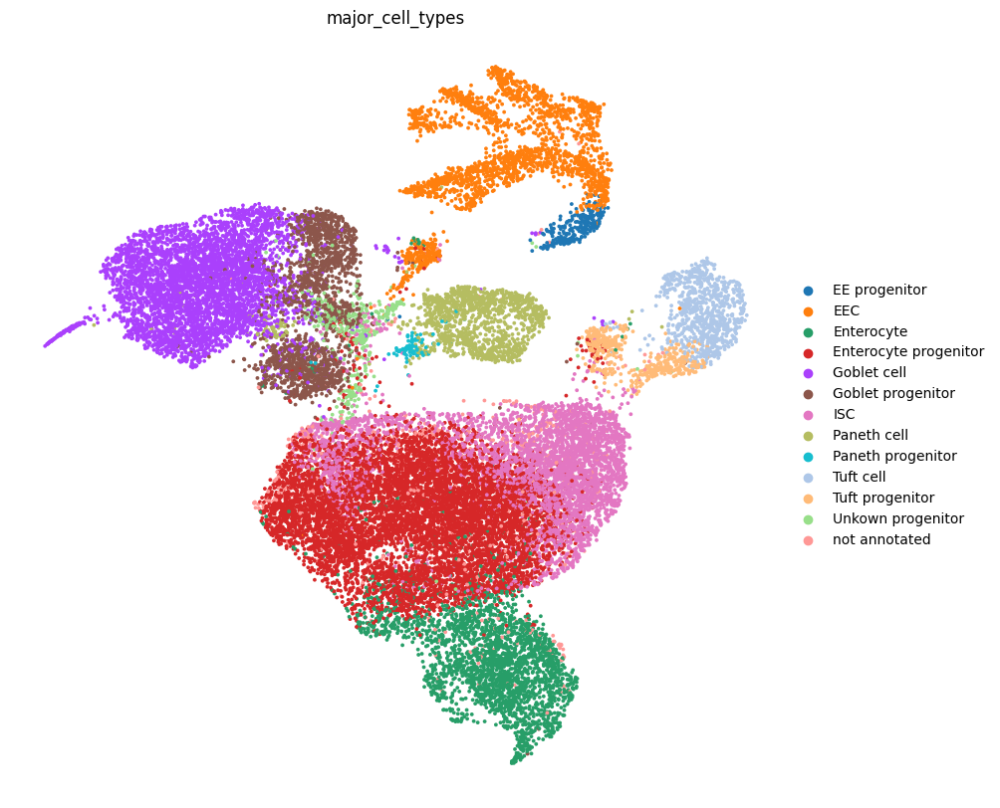

In [62]:
# Create a figure and axis with the desired size
fig, ax = plt.subplots(figsize=(10, 10))  # Adjust the figsize values as needed

# Plot UMAP on the specified axis
sc.pl.umap(
    adata,
    color=["major_cell_types"],
    frameon=False,
    size=30,
    ax=ax
)

# Show the plot
plt.show()

## Output the H5ad file  
**Strategy:**  
Only output what will be used subsequently.  
  

**List of things to keep:**  
adata.X  
adata.obs  
adata.var  
adata.uns['umap']  
adata.uns['Sample_colors']  
adata.uns['Diet_colors']  
adata.uns['final_annotations']  
adata.uns['final_annotations_colors']  
adata.uns['published_annotations_colors']  

In [59]:
adata

AnnData object with n_obs × n_vars = 27419 × 17573
    obs: 'Sample', 'Diet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'n_genes', 'n_counts', 'doublet_score', 'predicted_doublet', 'leiden', '_scvi_batch', '_scvi_labels', 'published_annotations', 'EEC_refined_1', 'EEC_refined_final', 'final_annotations', 'major_cell_types'
    var: 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'Diet_colors', 'Sample_colors', 'neighbors', 'published_annotations_colors', 'umap', 'EEC_refined_1', 'EEC_refined_1_colors', 'EEC_refined_final_colors

In [60]:
# Specify the components to keep in .uns
uns_keys_to_keep = [
    'umap', 'Sample_colors', 'Diet_colors', 'final_annotations', 'final_annotations_colors', 
    'published_annotations_colors', 'major_cell_types_colors', 'neighbors'
]

# Create a new dictionary with only the specified keys
adata_uns_filtered = {key: adata.uns[key] for key in uns_keys_to_keep if key in adata.uns}

# Assign the filtered uns dictionary back to adata
adata.uns = adata_uns_filtered

# Remove unnecessary layers, obsm, varm, obsp, varp, raw
adata.layers.clear()  # Clear any layers
adata.varm.clear()    # Clear any varm
adata.obsp.clear()    # Clear any obsp (e.g., pairwise similarities)
adata.varp.clear()    # Clear any varp (e.g., pairwise similarities for variables)

# Check if raw data is present and remove it if not needed
if adata.raw is not None:
    del adata.raw

In [61]:
adata.write('/home/glennrdx/Documents/Research_Project/processed_h5ad/crypt_enriched.h5ad')